# The City Hears Complaints, Not Sound

## Research question

**How do NYC 311 noise complaints vary by reported noise category and time of day, and what do those patterns reveal—and fail to reveal—about urban quiet?**

This notebook examines NYC 311 noise complaints created during **June 2026**. Each row represents a service request submitted to 311, not a direct acoustic measurement.

The analysis focuses on two attributes:

1. **Complaint type and descriptor** — how reported sounds are classified by the 311 system.
2. **Created date** — when reports are submitted, analyzed through hour and day of week.

The notebook includes static maps, non-map charts, an interactive Lonboard map, in-line interpretation, and exported cleaned data.

## 1. Setup

The class tutorial used `geopandas`, `matplotlib`, and `lonboard`. This notebook keeps the same workflow but replaces Census polygons with point-based 311 service requests.

In [1]:
from pathlib import Path
import time

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests

from lonboard import Map, ScatterplotLayer

In [2]:
DATA_DIR = Path("./Data")
OUTPUT_DIR = Path("./outputs")

DATA_DIR.mkdir(exist_ok=True)
OUTPUT_DIR.mkdir(exist_ok=True)

RAW_CSV = DATA_DIR / "noise_complaints_june_2026.csv"
CLEAN_GEOJSON = OUTPUT_DIR / "noise_complaints_june_2026.geojson"
CLEAN_CSV = OUTPUT_DIR / "noise_complaints_june_2026_clean.csv"

## 2. Load the dataset

The source is the NYC Open Data **311 Service Requests from 2020 to Present** Socrata endpoint.

I use a fixed one-month period rather than an always-changing “past year” dataset. This makes the analysis reproducible and keeps the file manageable while retaining complete weekday, weekend, and 24-hour cycles.

In [3]:
BASE_URL = "https://data.cityofnewyork.us/resource/erm2-nwe9.json"

SELECT_COLUMNS = ",".join(
    [
        "unique_key",
        "created_date",
        "closed_date",
        "agency",
        "complaint_type",
        "descriptor",
        "location_type",
        "borough",
        "incident_zip",
        "latitude",
        "longitude",
        "status",
        "open_data_channel_type",
    ]
)

WHERE_CLAUSE = " ".join(
    [
        "created_date >= '2026-06-01T00:00:00.000'",
        "AND created_date < '2026-07-01T00:00:00.000'",
        "AND complaint_type LIKE 'Noise%'",
        "AND latitude IS NOT NULL",
        "AND longitude IS NOT NULL",
    ]
)


def fetch_socrata_data(
    base_url: str,
    select: str,
    where: str,
    batch_size: int = 50000,
) -> pd.DataFrame:
    """Download every matching row from a Socrata API using pagination."""

    records = []
    offset = 0

    while True:
        params = {
            "$select": select,
            "$where": where,
            "$limit": batch_size,
            "$offset": offset,
            "$order": "created_date ASC",
        }

        response = requests.get(base_url, params=params, timeout=120)
        response.raise_for_status()
        batch = response.json()

        if not batch:
            break

        records.extend(batch)
        offset += len(batch)
        print(f"Downloaded {len(records):,} records")

        if len(batch) < batch_size:
            break

        time.sleep(0.25)

    return pd.DataFrame(records)

In [4]:
import os

proxy_variables = [
    "HTTP_PROXY",
    "HTTPS_PROXY",
    "ALL_PROXY",
    "http_proxy",
    "https_proxy",
    "all_proxy",
]

for variable in proxy_variables:
    os.environ.pop(variable, None)

print("Proxy settings cleared.")

Proxy settings cleared.


In [5]:
if RAW_CSV.exists():
    noise = pd.read_csv(RAW_CSV)
    print(f"Loaded cached file: {RAW_CSV}")
else:
    noise = fetch_socrata_data(
        base_url=BASE_URL,
        select=SELECT_COLUMNS,
        where=WHERE_CLAUSE,
    )
    noise.to_csv(RAW_CSV, index=False)
    print(f"Saved raw data to: {RAW_CSV}")

print(f"Rows: {len(noise):,}")
print(f"Columns: {noise.shape[1]}")

Loaded cached file: Data/noise_complaints_june_2026.csv
Rows: 76,260
Columns: 13


### Dataset scope

The query returned **76,260 noise-related 311 service requests** for June 2026. This is a sufficiently large sample for comparing categories, hours, and citywide spatial patterns.

However, the dataset covers only one month. The results describe a summer reporting period and should not automatically be generalized to other seasons or years.

In [6]:
noise.head()

,unique_key,created_date,closed_date,agency,complaint_type,descriptor,location_type,borough,incident_zip,latitude,longitude,status,open_data_channel_type
0,69195552,2026-06-01T00:00:03.000,2026-06-01T13:05:40.000,NYPD,Noise - Commercial,Loud Music/Party,Store/Commercial,BROOKLYN,11207.0,40.678930,-73.887806,Closed,MOBILE
1,69195106,2026-06-01T00:00:13.000,2026-06-01T00:28:37.000,NYPD,Noise - Street/Sidewalk,Loud Music/Party,Street/Sidewalk,BRONX,10467.0,40.882560,-73.882772,Closed,ONLINE
2,69192164,2026-06-01T00:00:25.000,2026-06-01T00:42:29.000,NYPD,Noise - Residential,Loud Music/Party,Residential Building/House,BROOKLYN,11226.0,40.652570,-73.951311,Closed,ONLINE
3,69195564,2026-06-01T00:00:37.000,2026-06-01T03:14:08.000,NYPD,Noise - Residential,Banging/Pounding,Residential Building/House,QUEENS,11420.0,40.679738,-73.822919,Closed,ONLINE
4,69189404,2026-06-01T00:00:45.000,2026-06-01T00:43:16.000,NYPD,Noise - Residential,Loud Music/Party,Residential Building/House,BRONX,10467.0,40.857960,-73.862918,Closed,PHONE


### Reading one record

Each row represents one submitted service request identified by a `unique_key`. It does **not** necessarily represent one unique sound event.

Several people may report the same event, one person may submit repeated reports, or a recurring source may generate multiple records over time. Complaint totals therefore measure the volume of recorded reporting activity rather than the number of independently verified noise events.

### Initial thought process

Before choosing visual variables, I need to understand what one row means and whether the relevant columns are complete.

A row represents a **submitted complaint**, so repeated complaints may refer to the same sound event, location, or source. The dataset therefore measures reporting activity rather than unique noise events.

In [7]:
noise.columns.tolist()

['unique_key',
 'created_date',
 'closed_date',
 'agency',
 'complaint_type',
 'descriptor',
 'location_type',
 'borough',
 'incident_zip',
 'latitude',
 'longitude',
 'status',
 'open_data_channel_type']

In [8]:
noise.info()

<class 'pandas.DataFrame'>
RangeIndex: 76260 entries, 0 to 76259
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   unique_key              76260 non-null  int64  
 1   created_date            76260 non-null  str    
 2   closed_date             75716 non-null  str    
 3   agency                  76260 non-null  str    
 4   complaint_type          76260 non-null  str    
 5   descriptor              76260 non-null  str    
 6   location_type           71176 non-null  str    
 7   borough                 76260 non-null  str    
 8   incident_zip            76258 non-null  float64
 9   latitude                76260 non-null  float64
 10  longitude               76260 non-null  float64
 11  status                  76260 non-null  str    
 12  open_data_channel_type  76260 non-null  str    
dtypes: float64(3), int64(1), str(9)
memory usage: 16.6 MB


In [9]:
noise.isna().sum().sort_values(ascending=False)

location_type             5084
closed_date                544
incident_zip                 2
unique_key                   0
created_date                 0
agency                       0
complaint_type               0
descriptor                   0
borough                      0
latitude                     0
longitude                    0
status                       0
open_data_channel_type       0
dtype: int64

### Data quality finding: the core analytical fields are complete

All **76,260 records** contain a complaint type, descriptor, borough, latitude, and longitude, so the category, time, and point-map analyses can retain the full dataset.

The main missing field is `location_type`, which is absent in **5,100 records (6.7%)**. `closed_date` is missing in **557 records (0.7%)**, and only two records lack a ZIP code. These gaps do not prevent the selected analysis, but they limit any detailed comparison of physical settings or response completion.

## 3. Clean and derive attributes

`created_date` is stored as text and must be converted to a datetime. Latitude and longitude must be numeric before geometry can be created.

From `created_date`, I derive:

- `hour`
- `day_name`
- `day_number`
- `is_weekend`

These are derived attributes rather than fields directly entered by the complainant.

In [10]:
noise["created_date"] = pd.to_datetime(
    noise["created_date"],
    errors="coerce",
)

noise["closed_date"] = pd.to_datetime(
    noise["closed_date"],
    errors="coerce",
)

noise["latitude"] = pd.to_numeric(
    noise["latitude"],
    errors="coerce",
)

noise["longitude"] = pd.to_numeric(
    noise["longitude"],
    errors="coerce",
)

noise = noise.dropna(
    subset=[
        "created_date",
        "latitude",
        "longitude",
        "complaint_type",
    ]
).copy()

noise["hour"] = noise["created_date"].dt.hour
noise["day_name"] = noise["created_date"].dt.day_name()
noise["day_number"] = noise["created_date"].dt.dayofweek
noise["is_weekend"] = noise["day_number"].ge(5)
noise["date"] = noise["created_date"].dt.date

noise.shape

(76260, 18)

In [11]:
noise[
    [
        "created_date",
        "complaint_type",
        "descriptor",
        "borough",
        "hour",
        "day_name",
        "is_weekend",
    ]
].head()

,created_date,complaint_type,descriptor,borough,hour,day_name,is_weekend
0,2026-06-01 00:00:03,Noise - Commercial,Loud Music/Party,BROOKLYN,0,Monday,False
1,2026-06-01 00:00:13,Noise - Street/Sidewalk,Loud Music/Party,BRONX,0,Monday,False
2,2026-06-01 00:00:25,Noise - Residential,Loud Music/Party,BROOKLYN,0,Monday,False
3,2026-06-01 00:00:37,Noise - Residential,Banging/Pounding,QUEENS,0,Monday,False
4,2026-06-01 00:00:45,Noise - Residential,Loud Music/Party,BRONX,0,Monday,False


In [12]:
noise_gdf = gpd.GeoDataFrame(
    noise,
    geometry=gpd.points_from_xy(
        noise["longitude"],
        noise["latitude"],
    ),
    crs="EPSG:4326",
)

noise_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Spatial data check

The latitude and longitude fields were successfully converted into point geometries using **WGS 84 (`EPSG:4326`)**, which is appropriate for web mapping and GeoJSON export.

Because this is a geographic coordinate system measured in degrees, it should not be used directly for accurate distance calculations. A later network or distance analysis should first project the data into an appropriate local projected coordinate system.

## 4. Attribute 1: reported noise category

I first use `complaint_type` because it is broad enough to compare major forms of reported noise. I then inspect `descriptor` to understand the more detailed language nested inside those categories.

These fields tell us how complaints are classified by the service system. They do **not** tell us the measured loudness, duration, or acoustic character of the sound.

In [13]:
complaint_counts = (
    noise["complaint_type"]
    .value_counts()
    .rename_axis("complaint_type")
    .reset_index(name="complaints")
)

complaint_counts

,complaint_type,complaints
0,Noise - Residential,33969
1,Noise - Street/Sidewalk,23619
2,Noise - Vehicle,5958
3,Noise - Commercial,5608
4,Noise,5100
5,Noise - Park,1239
6,Noise - Helicopter,525
7,Noise - House of Worship,242


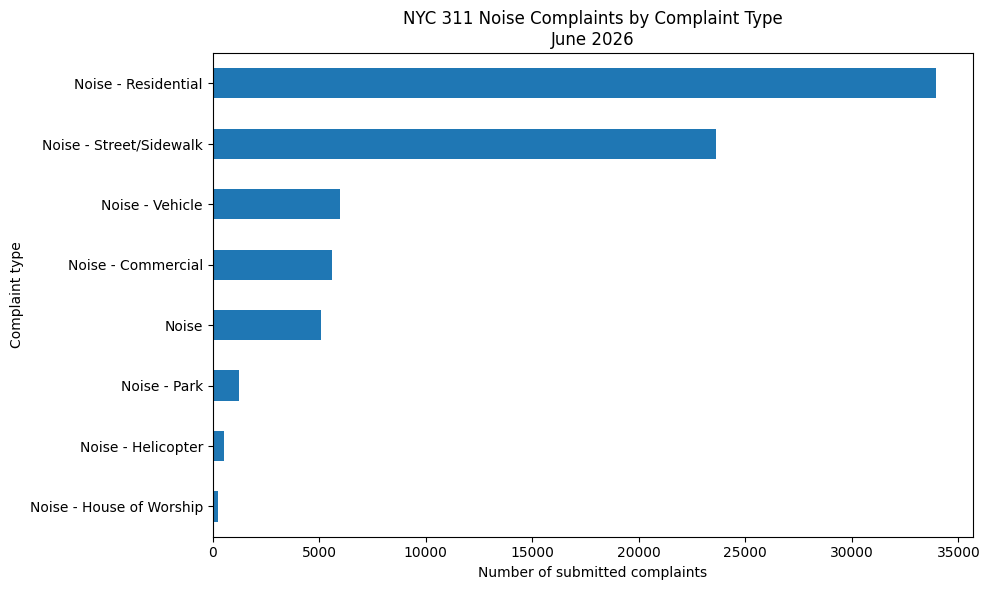

In [14]:
ax = (
    complaint_counts
    .sort_values("complaints")
    .plot.barh(
        x="complaint_type",
        y="complaints",
        figsize=(10, 6),
        legend=False,
    )
)

ax.set_title("NYC 311 Noise Complaints by Complaint Type\nJune 2026")
ax.set_xlabel("Number of submitted complaints")
ax.set_ylabel("Complaint type")

plt.tight_layout()
plt.show()

### Finding 1: most reports concern residential and street-level noise

**Noise – Residential** accounts for **33,969 complaints (44.5%)**, while **Noise – Street/Sidewalk** accounts for **23,619 complaints (31.0%)**. Together, these two categories represent **75.5%** of all records in the month.

This indicates that the official complaint landscape is dominated by conflicts occurring close to homes and shared public streets. It does not prove that these environments are objectively louder than other parts of the city. Their high counts may also reflect population density, proximity between residents, nighttime expectations, repeated reporting, and familiarity with 311.

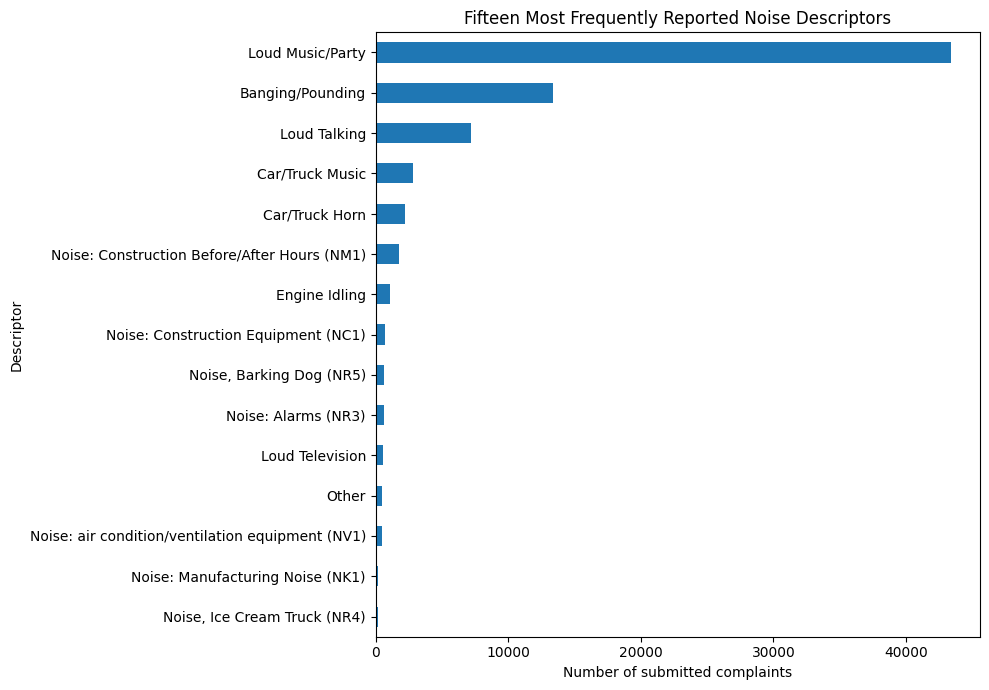

In [15]:
descriptor_counts = (
    noise["descriptor"]
    .fillna("Not specified")
    .value_counts()
    .head(15)
    .sort_values()
)

ax = descriptor_counts.plot.barh(figsize=(10, 7))

ax.set_title("Fifteen Most Frequently Reported Noise Descriptors")
ax.set_xlabel("Number of submitted complaints")
ax.set_ylabel("Descriptor")

plt.tight_layout()
plt.show()

### Finding 2: social sound dominates the detailed descriptors

**Loud Music/Party** is by far the most frequently reported descriptor, substantially exceeding **Banging/Pounding** and **Loud Talking**. The leading descriptors are therefore primarily associated with nearby human and social activity rather than industrial or mechanical sources.

This does not prove that music and parties are objectively the loudest sounds in New York. These sounds may be especially noticeable in residential settings, more disruptive during sleeping hours, and easier for residents to recognize and classify through the 311 interface.

## 5. Attribute 2: time of report

The timestamp allows us to examine the temporal rhythm of reporting. I use the hour and day of week because noise that becomes objectionable at night may be tolerated during the day.

The timestamp records when a complaint was created, which may differ from when the sound began.

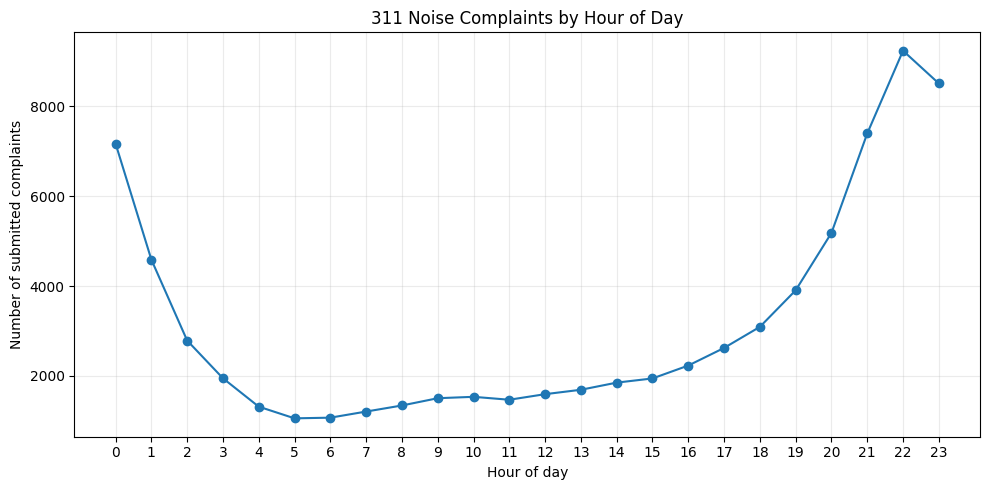

In [16]:
hourly_counts = (
    noise.groupby("hour")
    .size()
    .reindex(range(24), fill_value=0)
)

ax = hourly_counts.plot(
    figsize=(10, 5),
    marker="o",
)

ax.set_title("311 Noise Complaints by Hour of Day")
ax.set_xlabel("Hour of day")
ax.set_ylabel("Number of submitted complaints")
ax.set_xticks(range(24))
ax.grid(alpha=0.25)

plt.tight_layout()
plt.show()

### Finding 3: reporting peaks at 10 PM

Complaint activity is lowest around **5–6 AM**, rises gradually through the afternoon, and increases sharply after **7 PM**. The highest point occurs at approximately **10 PM**, with reporting remaining high through 11 PM and midnight.

This temporal rhythm suggests that sound becomes particularly reportable when it conflicts with evening routines, domestic rest, and sleep. The timestamp records when the complaint was created, however, not necessarily when the sound began or when it was loudest.

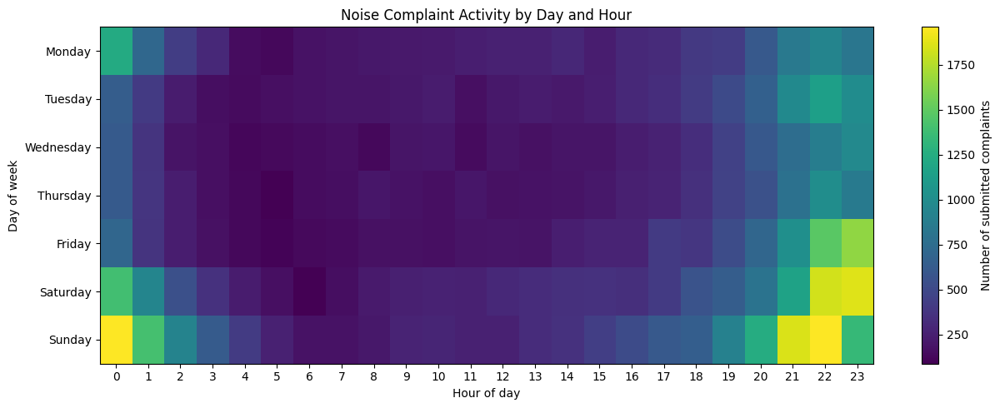

In [17]:
day_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]

day_hour = (
    noise.groupby(["day_name", "hour"])
    .size()
    .unstack(fill_value=0)
    .reindex(day_order)
    .reindex(columns=range(24), fill_value=0)
)

fig, ax = plt.subplots(figsize=(13, 5))

image = ax.imshow(
    day_hour.values,
    aspect="auto",
)

ax.set_title("Noise Complaint Activity by Day and Hour")
ax.set_xlabel("Hour of day")
ax.set_ylabel("Day of week")
ax.set_xticks(range(24))
ax.set_yticks(range(len(day_order)))
ax.set_yticklabels(day_order)

fig.colorbar(
    image,
    ax=ax,
    label="Number of submitted complaints",
)

plt.tight_layout()
plt.show()

### Finding 4: weekend transitions concentrate nighttime complaints

The strongest cells cluster around **Friday and Saturday late evenings** and the hours immediately after midnight, including early Sunday. The pattern suggests that the weekly rhythm of nightlife, gatherings, and time spent at home influences when noise becomes visible to the 311 system.

The heatmap displays raw monthly totals rather than a normalized rate for an average weekday. Because June 2026 contains unequal numbers of particular weekdays, it should be read as the distribution of complaints during this month rather than a perfectly controlled comparison among days.

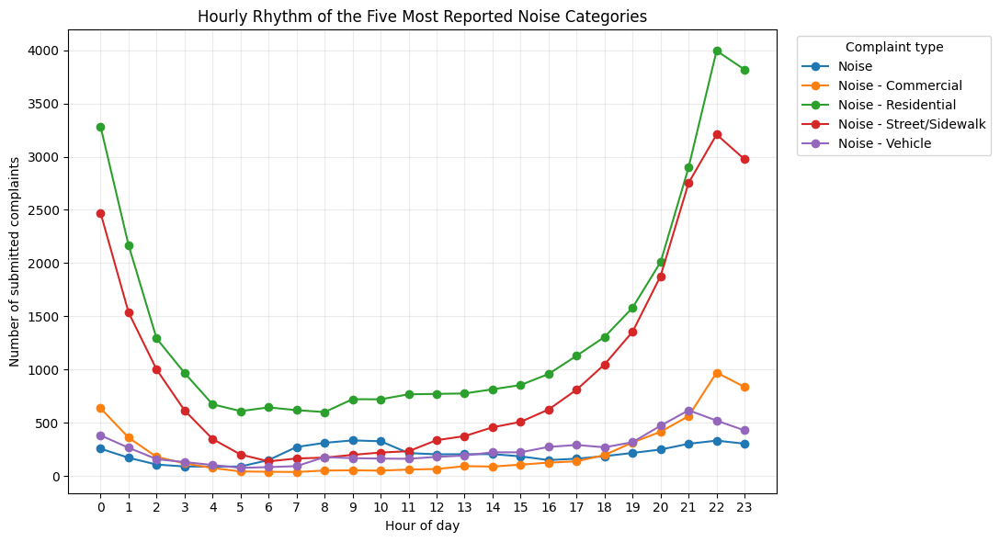

In [18]:
top_types = complaint_counts.head(5)["complaint_type"].tolist()

type_hour = (
    noise[noise["complaint_type"].isin(top_types)]
    .groupby(["hour", "complaint_type"])
    .size()
    .unstack(fill_value=0)
    .reindex(range(24), fill_value=0)
)

ax = type_hour.plot(
    figsize=(11, 6),
    marker="o",
)

ax.set_title("Hourly Rhythm of the Five Most Reported Noise Categories")
ax.set_xlabel("Hour of day")
ax.set_ylabel("Number of submitted complaints")
ax.set_xticks(range(24))
ax.grid(alpha=0.25)
ax.legend(title="Complaint type", bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

### Finding 5: different noise categories operate on different schedules

Residential and street/sidewalk complaints dominate the evening increase and both peak around **10 PM**. Commercial complaints also rise sharply late in the evening, while vehicle complaints follow a flatter pattern with a smaller nighttime peak.

The chart demonstrates that “noise” is not one uniform urban condition. Different complaint categories correspond to different activities, schedules, locations, and expectations of acceptable behavior. Aggregating them into one citywide total would conceal these distinctions.

## 6. Static spatial visualizations

The first map checks the overall geometry and reveals the broad concentration of submitted complaints. Dense point overlap is itself a limitation: a dark area may contain many complaints at one building, many separate sound events, or many residents reporting the same event.

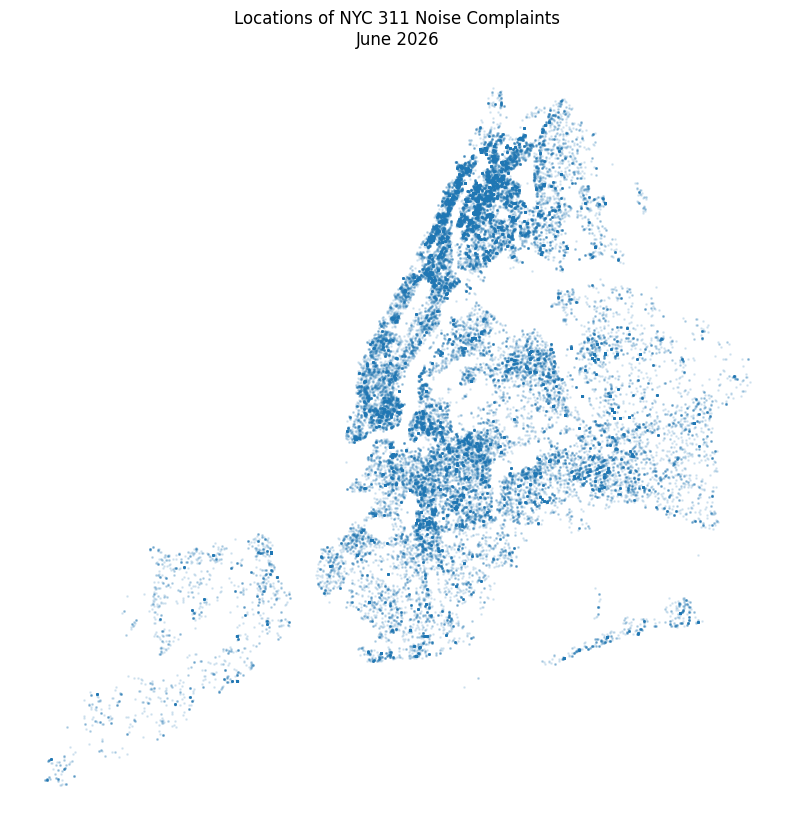

In [19]:
plot_sample = noise_gdf

if len(plot_sample) > 100000:
    plot_sample = plot_sample.sample(
        100000,
        random_state=42,
    )
    print("Static map uses a 100,000-point sample for legibility.")

ax = plot_sample.plot(
    figsize=(10, 10),
    markersize=1,
    alpha=0.12,
)

ax.set_title("Locations of NYC 311 Noise Complaints\nJune 2026")
ax.set_axis_off()

plt.show()

### Finding 6: complaint points follow the geography of dense urban settlement

Complaints are strongly concentrated across Manhattan, the Bronx, and central and northern Brooklyn. Queens shows a more dispersed pattern, while Staten Island contains substantially fewer points.

This map uses raw complaint locations and is **not normalized by population, land area, housing density, or the number of potential 311 users**. A dense cluster may indicate intense sound, many nearby residents, repeated reports, or a combination of these factors. The map cannot be used by itself to rank neighborhoods from loudest to quietest.

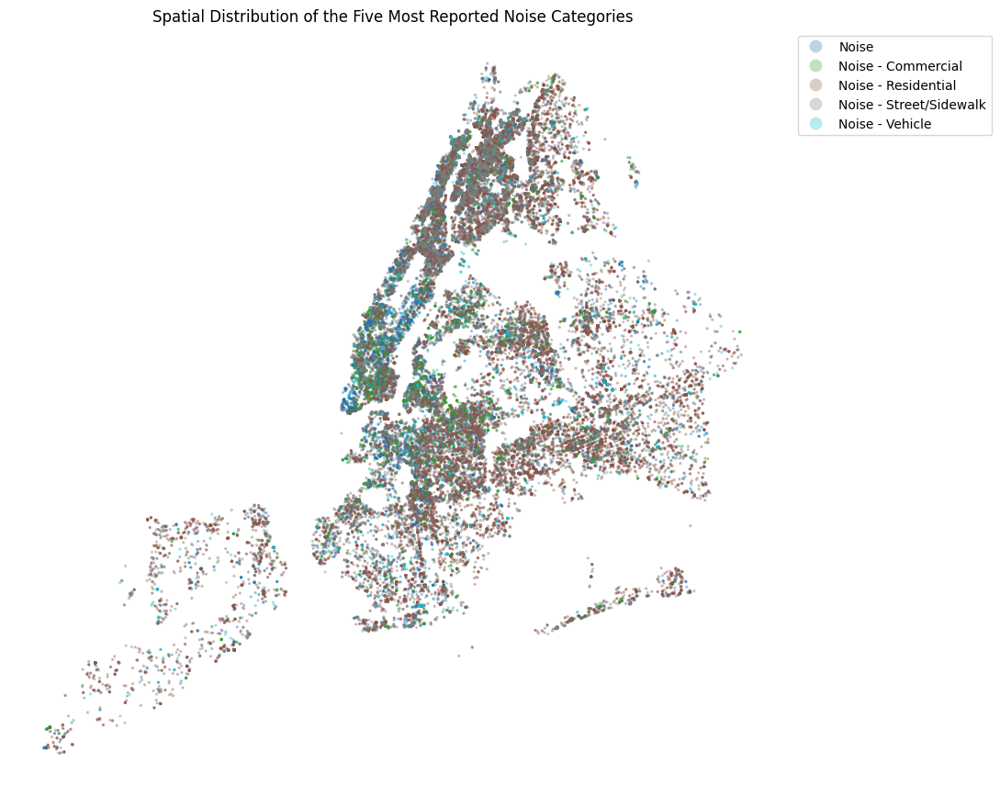

In [20]:
top_map_types = complaint_counts.head(5)["complaint_type"].tolist()

category_sample = noise_gdf[
    noise_gdf["complaint_type"].isin(top_map_types)
].copy()

if len(category_sample) > 100000:
    category_sample = category_sample.sample(
        100000,
        random_state=42,
    )

ax = category_sample.plot(
    column="complaint_type",
    categorical=True,
    legend=True,
    figsize=(11, 11),
    markersize=2,
    alpha=0.3,
)

ax.set_title("Spatial Distribution of the Five Most Reported Noise Categories")
ax.set_axis_off()

legend = ax.get_legend()
if legend is not None:
    legend.set_bbox_to_anchor((1.02, 1))
    legend.set_loc("upper left")

plt.tight_layout()
plt.show()

### Finding 7: complaint categories overlap but do not produce identical geographies

Residential complaints visibly dominate large portions of the outer-borough residential landscape. Commercial and street/sidewalk complaints are more mixed within dense central areas, while vehicle complaints form a thinner and more dispersed citywide pattern.

The overlap shows that neighborhoods may experience several forms of reported noise at the same time. The map identifies spatial differences but does not explain their causes. Interpreting them would require related data such as population, land use, nightlife activity, traffic, construction, and housing conditions.

## 7. Interactive Lonboard map

The interactive map makes it possible to zoom into dense areas and inspect records. To keep the layer legible, the five most frequently reported complaint types receive categorical colors.

Hovering or clicking should be treated as record inspection, not verification of the sound event.

In [21]:
lonboard_gdf = noise_gdf[
    noise_gdf["complaint_type"].isin(top_map_types)
][
    [
        "unique_key",
        "created_date",
        "complaint_type",
        "descriptor",
        "borough",
        "hour",
        "geometry",
    ]
].copy()

# Generate RGBA colors from Matplotlib's default categorical colormap.
category_lookup = {
    category: index
    for index, category in enumerate(top_map_types)
}

cmap = plt.get_cmap("tab10")

fill_colors = np.array(
    [
        [
            int(channel * 255)
            for channel in cmap(category_lookup[value])[:3]
        ] + [150]
        for value in lonboard_gdf["complaint_type"]
    ],
    dtype=np.uint8,
)

noise_layer = ScatterplotLayer.from_geopandas(
    lonboard_gdf,
    get_fill_color=fill_colors,
    get_radius=18,
    radius_min_pixels=2,
    radius_max_pixels=8,
    pickable=True,
)

view_state = {
    "longitude": -73.95,
    "latitude": 40.72,
    "zoom": 9.5,
    "pitch": 0,
    "bearing": 0,
}

noise_map = Map(
    noise_layer,
    view_state=view_state,
)

noise_map

### Finding 8: changing scale changes the interpretation of density

At the city scale, complaint points appear as broad continuous concentrations. Zooming to the neighborhood or block scale reveals that those concentrations are composed of highly localized clusters and repeated points near particular addresses and corridors.

A local cluster may represent multiple separate events, a recurring source, several residents reporting the same event, or repeated submissions by one resident. Interactivity supports closer inspection of records, but it does not verify the sound or distinguish automatically among these possibilities.

**Technical note:** the Lonboard widget is interactive in Jupyter, but GitHub may not preserve the live widget. The static maps above ensure that the principal spatial findings remain visible in the submitted Notebook.

## 8. What the attributes can and cannot tell us

| Attribute | What it can tell us | What it cannot tell us |
|---|---|---|
| Complaint type / descriptor | How reported sounds are classified; which categories enter the 311 system most frequently; where categories cluster | Actual decibel level; duration; whether the sound was harmful, pleasant, expected, or verified |
| Created date / hour | When reports are submitted; recurring daily and weekly reporting rhythms | Exact start time of the sound; how long it lasted; whether reporting was immediate |
| Complaint coordinates | Where service requests are geographically associated; areas with concentrated reports | A continuous map of acoustic conditions; whether areas without reports are quiet |
| Complaint count | Volume of recorded reporting activity | Number of unique sound events or unique affected residents |

The central limitation is conceptual: **the dataset measures complaints, not sound**. A complaint map is partly a map of urban acoustics, but it is also a map of access to 311, expectations of acceptable sound, willingness to report, and government classification.

## Key findings

1. The dataset contains **76,260 noise-related service requests** submitted during June 2026.
2. Residential and street/sidewalk complaints together account for **75.5%** of the records.
3. **Loud Music/Party** dominates the detailed descriptors, showing that nearby social activity is central to the reported noise landscape.
4. Reporting follows a strong temporal rhythm, reaching its citywide peak around **10 PM** and intensifying around weekend nights.
5. Residential, street, commercial, and vehicle complaints have different hourly patterns, so urban noise cannot be treated as a single uniform category.
6. Complaints are spatially concentrated, but raw point density is not a direct measurement of sound intensity or neighborhood quietness.
7. Overall, the dataset maps **reporting behavior and governmental classification as much as it maps urban sound**.

## 9. Conclusion

The June 2026 data shows that New York City hears noise primarily through complaints about residential and street-level activity, especially loud music and parties. These reports are concentrated during late-evening hours, intensify around the weekend, and vary according to the type of sound being reported.

Spatial clustering is also clear, but it cannot be interpreted as a direct acoustic measurement. Dense areas may contain more sound, more residents, greater access to 311, stronger expectations of quiet, or repeated complaints about the same source.

The central finding therefore supports the title of the notebook: **the city hears complaints, not sound**. The 311 system converts subjective encounters with sound into official categories, timestamps, and coordinates. It makes some forms of noise administratively visible while leaving actual loudness, duration, personal meaning, and unreported experience outside the dataset.

A next stage of the broader project can compare this official reporting geography with a personal dataset documenting where quiet, rest, and temporary refuge are actually experienced.

## 10. Save cleaned data

The cleaned CSV preserves latitude and longitude as columns. The GeoJSON preserves point geometry and can be used in later GIS or web-mapping assignments.

In [22]:
export_columns = [
    "unique_key",
    "created_date",
    "closed_date",
    "complaint_type",
    "descriptor",
    "location_type",
    "borough",
    "incident_zip",
    "latitude",
    "longitude",
    "status",
    "open_data_channel_type",
    "hour",
    "day_name",
    "is_weekend",
]

noise[export_columns].to_csv(
    CLEAN_CSV,
    index=False,
)

noise_gdf[export_columns + ["geometry"]].to_file(
    CLEAN_GEOJSON,
    driver="GeoJSON",
)

print(f"Saved CSV: {CLEAN_CSV}")
print(f"Saved GeoJSON: {CLEAN_GEOJSON}")

Saved CSV: outputs/noise_complaints_june_2026_clean.csv
Saved GeoJSON: outputs/noise_complaints_june_2026.geojson
